In [72]:
#TODO: 1) Try out other feature-descriptors (maybe a custom-matcher for poorly matched images )
#      2) Optimize time for the feature-matching and homogrpahy part.


import numpy as np
import cv2
import scipy.io
import os
from numpy.linalg import norm
from matplotlib import pyplot as plt
from numpy.linalg import det
from numpy.linalg import inv
from scipy.linalg import rq
from numpy.linalg import svd
import matplotlib.pyplot as plt
import numpy as np
import math
import random
import sys
from scipy import ndimage, spatial
from tqdm.notebook import tqdm, trange


### **Importing Drive (Dataset-Small Village-Sensefly)**

In [73]:
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [74]:
plt.figure(figsize=(20,10)) 


<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

In [75]:

class Image:
    def __init__(self, img, position):
        
        self.img = img
        self.position = position

inlier_matchset = []
def features_matching(a,keypointlength,threshold):
  #threshold=0.2
  bestmatch=np.empty((keypointlength),dtype= np.int16)
  img1index=np.empty((keypointlength),dtype=np.int16)
  distance=np.empty((keypointlength))
  index=0
  for j in range(0,keypointlength):
    #For a descriptor fa in Ia, take the two closest descriptors fb1 and fb2 in Ib
    x=a[j]
    listx=x.tolist()
    x.sort()
    minval1=x[0]                                # min 
    minval2=x[1]                                # 2nd min
    itemindex1 = listx.index(minval1)           #index of min val    
    itemindex2 = listx.index(minval2)           #index of second min value 
    ratio=minval1/minval2                       #Ratio Test
    
    if ratio<threshold: 
      #Low distance ratio: fb1 can be a good match
      bestmatch[index]=itemindex1
      distance[index]=minval1
      img1index[index]=j
      index=index+1
  return  [cv2.DMatch(img1index[i],bestmatch[i].astype(int),distance[i]) for i in range(0,index)]
          
   
  
def compute_Homography(im1_pts,im2_pts):
  """
  im1_pts and im2_pts are 2×n matrices with
  4 point correspondences from the two images
  """
  num_matches=len(im1_pts)
  num_rows = 2 * num_matches
  num_cols = 9
  A_matrix_shape = (num_rows,num_cols)
  A = np.zeros(A_matrix_shape)
  a_index = 0
  for i in range(0,num_matches):
    (a_x, a_y) = im1_pts[i]
    (b_x, b_y) = im2_pts[i]
    row1 = [a_x, a_y, 1, 0, 0, 0, -b_x*a_x, -b_x*a_y, -b_x] # First row 
    row2 = [0, 0, 0, a_x, a_y, 1, -b_y*a_x, -b_y*a_y, -b_y] # Second row 

    # place the rows in the matrix
    A[a_index] = row1
    A[a_index+1] = row2

    a_index += 2
    
  U, s, Vt = np.linalg.svd(A)

  #s is a 1-D array of singular values sorted in descending order
  #U, Vt are unitary matrices
  #Rows of Vt are the eigenvectors of A^TA.
  #Columns of U are the eigenvectors of AA^T.
  H = np.eye(3)
  H = Vt[-1].reshape(3,3) # take the last row of the Vt matrix
  return H
  
  
def displayplot(img,title):
  
  plt.figure(figsize=(15,15))
  plt.title(title)
  plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
  plt.show()
  


In [76]:

def RANSAC_alg(f1, f2, matches, nRANSAC, RANSACthresh):

      
    minMatches = 4
    nBest = 0
    best_inliers = []
    H_estimate = np.eye(3,3)
    global inlier_matchset
    inlier_matchset=[]
    for iteration in range(nRANSAC):
      
        #Choose a minimal set of feature matches.
        matchSample = random.sample(matches, minMatches)
        
        #Estimate the Homography implied by these matches
        im1_pts=np.empty((minMatches,2))
        im2_pts=np.empty((minMatches,2))
        for i in range(0,minMatches):
          m = matchSample[i]
          im1_pts[i] = f1[m.queryIdx].pt
          im2_pts[i] = f2[m.trainIdx].pt
          #im1_pts[i] = f1[m[0]].pt
          #im2_pts[i] = f2[m[1]].pt             
          
        H_estimate=compute_Homography(im1_pts,im2_pts)
        
               
        # Calculate the inliers for the H
        inliers = get_inliers(f1, f2, matches, H_estimate, RANSACthresh)

        # if the number of inliers is higher than previous iterations, update the best estimates
        if len(inliers) > nBest:
            nBest= len(inliers)
            best_inliers = inliers

    print("Number of best inliers",len(best_inliers))
    for i in range(len(best_inliers)):
      inlier_matchset.append(matches[best_inliers[i]])
    
    # compute a homography given this set of matches
    im1_pts=np.empty((len(best_inliers),2))
    im2_pts=np.empty((len(best_inliers),2))
    for i in range(0,len(best_inliers)):
      m = inlier_matchset[i]
      im1_pts[i] = f1[m.queryIdx].pt
      im2_pts[i] = f2[m.trainIdx].pt
      #im1_pts[i] = f1[m[0]].pt
      #im2_pts[i] = f2[m[1]].pt

    M=compute_Homography(im1_pts,im2_pts)
    return M




In [77]:

def get_inliers(f1, f2, matches, H, RANSACthresh):

  inlier_indices = []
  for i in range(len(matches)):
    queryInd = matches[i].queryIdx
    trainInd = matches[i].trainIdx

    #queryInd = matches[i][0]
    #trainInd = matches[i][1]

    queryPoint = np.array([f1[queryInd].pt[0],  f1[queryInd].pt[1], 1]).T 
    trans_query = H.dot(queryPoint) 

   
    comp1 = [trans_query[0]/trans_query[2], trans_query[1]/trans_query[2]] # normalize with respect to z
    comp2 = np.array(f2[trainInd].pt)[:2]
    

    if(np.linalg.norm(comp1-comp2) <= RANSACthresh): # check against threshold
      inlier_indices.append(i)
  return inlier_indices


def ImageBounds(img, H):

    h, w= img.shape[0], img.shape[1]
    p1 = np.dot(H, np.array([0, 0, 1]))
    p2 = np.dot(H, np.array([0, h - 1, 1]))
    p3 = np.dot(H, np.array([w - 1, 0, 1]))
    p4 = np.dot(H, np.array([w - 1, h - 1, 1]))
    x1 = p1[0] / p1[2]
    y1 = p1[1] / p1[2]
    x2 = p2[0] / p2[2]
    y2 = p2[1] / p2[2]
    x3 = p3[0] / p3[2]
    y3 = p3[1] / p3[2]
    x4 = p4[0] / p4[2]
    y4 = p4[1] / p4[2]
    minX = math.ceil(min(x1, x2, x3, x4))
    minY = math.ceil(min(y1, y2, y3, y4))
    maxX = math.ceil(max(x1, x2, x3, x4))
    maxY = math.ceil(max(y1, y2, y3, y4))

    return int(minX), int(minY), int(maxX), int(maxY)
  
  
def Populate_Images(img, accumulator, H, bw):
  


    h, w = img.shape[0], img.shape[1]
    minX, minY, maxX, maxY = ImageBounds(img, H)

    for i in range(minX, maxX + 1):
        for j in range(minY, maxY + 1):
            p = np.dot(np.linalg.inv(H), np.array([i, j, 1]))

            x = p[0]
            y = p[1]
            z = p[2]

            _x = int(x / z)
            _y = int(y / z)

            if _x < 0 or _x >= w - 1 or _y < 0 or _y >= h - 1:
                continue

            if img[_y, _x, 0] == 0 and img[_y, _x, 1] == 0 and img[_y, _x, 2] == 0:
                continue

            wt = 1.0

            if _x >= minX and _x < minX + bw:
                wt = float(_x - minX) /bw
            if _x <= maxX and _x > maxX -bw:
                wt = float(maxX - _x) /bw

            accumulator[j, i, 3] += wt

            for c in range(3):
                accumulator[j, i, c] += img[_y, _x, c] *wt


  

In [78]:

def Image_Stitch(Imagesall, blendWidth, accWidth, accHeight, translation):
    channels=3
    #width=720

    acc = np.zeros((accHeight, accWidth, channels + 1))
    M = np.identity(3)
    for count, i in enumerate(Imagesall):
        M = i.position
        img = i.img
        M_trans = translation.dot(M)
        Populate_Images(img, acc, M_trans, blendWidth)
    
    height, width = acc.shape[0], acc.shape[1]

    img = np.zeros((height, width, 3))
    for i in range(height):
        for j in range(width):
            weights = acc[i, j, 3]
            if weights > 0:
                for c in range(3):
                    img[i, j, c] = int(acc[i, j, c] / weights)
                    

    Imagefull = np.uint8(img)
    M = np.identity(3)
    for count, i in enumerate(Imagesall):
        if count != 0 and count != (len(Imagesall) - 1):
            continue

        M = i.position

        M_trans = translation.dot(M)

        p = np.array([0.5 * width, 0, 1])
        p = M_trans.dot(p)

        
        if count == 0:
            x_init, y_init = p[:2] / p[2]
        
        if count == (len(Imagesall) - 1):
            x_final, y_final = p[:2] / p[2]
    
    
    A = np.identity(3)
    croppedImage = cv2.warpPerspective(
        Imagefull, A, (accWidth, accHeight), flags=cv2.INTER_LINEAR
    )
    displayplot(croppedImage, 'Final Stitched Image')



In [79]:
#!pip uninstall opencv-python
#!pip install opencv-contrib-python===4.4.0.44
!pip install opencv-python==4.4.0.44
!pip install opencv-contrib-python==4.4.0.44

In [80]:
print(cv2.__version__)

4.4.0


## **Reading images and Extracting BRISK Keypoints and Descriptors from each**

In [81]:
files_all = os.listdir('/content/drive/My Drive/small_village_full/')
files_all.sort()
folder_path = '/content/drive/My Drive/small_village_full/'

centre_file = folder_path + files_all[88]
left_files_path_rev = []
right_files_path = []

for file in files_all[80:89]:
  left_files_path_rev.append(folder_path + file)

left_files_path = left_files_path_rev[::-1]

for file in files_all[88:97]:
  right_files_path.append(folder_path + file)


In [82]:
print(left_files_path)

['/content/drive/My Drive/small_village_full/IMG_1000.JPG', '/content/drive/My Drive/small_village_full/IMG_0999.JPG', '/content/drive/My Drive/small_village_full/IMG_0998.JPG', '/content/drive/My Drive/small_village_full/IMG_0997.JPG', '/content/drive/My Drive/small_village_full/IMG_0996.JPG', '/content/drive/My Drive/small_village_full/IMG_0995.JPG', '/content/drive/My Drive/small_village_full/IMG_0994.JPG', '/content/drive/My Drive/small_village_full/IMG_0993.JPG', '/content/drive/My Drive/small_village_full/IMG_0992.JPG']


In [83]:
print(right_files_path)

['/content/drive/My Drive/small_village_full/IMG_1000.JPG', '/content/drive/My Drive/small_village_full/IMG_1001.JPG', '/content/drive/My Drive/small_village_full/IMG_1002.JPG', '/content/drive/My Drive/small_village_full/IMG_1003.JPG', '/content/drive/My Drive/small_village_full/IMG_1004.JPG', '/content/drive/My Drive/small_village_full/IMG_1005.JPG', '/content/drive/My Drive/small_village_full/IMG_1006.JPG', '/content/drive/My Drive/small_village_full/IMG_1007.JPG', '/content/drive/My Drive/small_village_full/IMG_1008.JPG']


In [84]:
images_left = []
images_right = []


for file in tqdm(left_files_path):
  left_image_sat= cv2.imread(file)
  left_img = cv2.resize(left_image_sat,None,fx=0.75, fy=0.75, interpolation = cv2.INTER_CUBIC)
  images_left.append(left_img)


for file in tqdm(right_files_path):
  right_image_sat= cv2.imread(file)
  right_img = cv2.resize(right_image_sat,None,fx=0.75, fy=0.75, interpolation = cv2.INTER_CUBIC)
  images_right.append(right_img)



In [85]:
#brisk = cv2.KAZE_create()
Threshl=60;
Octaves=6; 
#PatternScales=1.0f;
brisk = cv2.BRISK_create(Threshl,Octaves)
#brisk = cv2.SIFT_create()
#brisk = cv2.AKAZE_create()


keypoints_all_left = []
descriptors_all_left = []
points_all_left=[]

keypoints_all_right = []
descriptors_all_right = []
points_all_right=[]

for imgs in tqdm(images_left):
  kpt = brisk.detect(imgs,None)
  kpt,descrip =  brisk.compute(imgs, kpt)
  keypoints_all_left.append(kpt)
  descriptors_all_left.append(descrip)
  points_all_left.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

for imgs in tqdm(images_right):
  kpt = brisk.detect(imgs,None)
  kpt,descrip =  brisk.compute(imgs, kpt)
  keypoints_all_right.append(kpt)
  descriptors_all_right.append(descrip)
  points_all_right.append(np.asarray([[p.pt[0], p.pt[1]] for p in kpt]))

In [86]:
print(len(images_left))

9


In [87]:
print(left_files_path)

['/content/drive/My Drive/small_village_full/IMG_1000.JPG', '/content/drive/My Drive/small_village_full/IMG_0999.JPG', '/content/drive/My Drive/small_village_full/IMG_0998.JPG', '/content/drive/My Drive/small_village_full/IMG_0997.JPG', '/content/drive/My Drive/small_village_full/IMG_0996.JPG', '/content/drive/My Drive/small_village_full/IMG_0995.JPG', '/content/drive/My Drive/small_village_full/IMG_0994.JPG', '/content/drive/My Drive/small_village_full/IMG_0993.JPG', '/content/drive/My Drive/small_village_full/IMG_0992.JPG']


In [88]:
print(right_files_path)

['/content/drive/My Drive/small_village_full/IMG_1000.JPG', '/content/drive/My Drive/small_village_full/IMG_1001.JPG', '/content/drive/My Drive/small_village_full/IMG_1002.JPG', '/content/drive/My Drive/small_village_full/IMG_1003.JPG', '/content/drive/My Drive/small_village_full/IMG_1004.JPG', '/content/drive/My Drive/small_village_full/IMG_1005.JPG', '/content/drive/My Drive/small_village_full/IMG_1006.JPG', '/content/drive/My Drive/small_village_full/IMG_1007.JPG', '/content/drive/My Drive/small_village_full/IMG_1008.JPG']


## **Image Matching (Robust) through RANSAC and Homography Matrix computation**

In [96]:
def get_Hmatrix(imgs,keypts,pts,descripts,disp=True):
  #FLANN_INDEX_KDTREE = 1
  #index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
  #search_params = dict(checks=50)
  #flann = cv2.FlannBasedMatcher(index_params, search_params)
  flann = cv2.BFMatcher()



  lff1 = np.float32(descripts[0])
  lff = np.float32(descripts[1])


  matches_lf1_lf = flann.knnMatch(lff1, lff, k=2)

  #print(len(matches_lf1_lf))

  matches_4 = []
  ratio = 0.8
  # loop over the raw matches
  for m in matches_lf1_lf:
    # ensure the distance is within a certain ratio of each
    # other (i.e. Lowe’s ratio test)
    if len(m) == 2 and m[0].distance < m[1].distance * ratio:
        #matches_1.append((m[0].trainIdx, m[0].queryIdx))
        matches_4.append(m[0])

  print("Number of matches",len(matches_4))

  # Estimate homography 1
  #Compute H1
  imm1_pts=np.empty((len(matches_4),2))
  imm2_pts=np.empty((len(matches_4),2))
  for i in range(0,len(matches_4)):
    m = matches_4[i]
    (a_x, a_y) = keypts[0][m.queryIdx].pt
    (b_x, b_y) = keypts[1][m.trainIdx].pt
    imm1_pts[i]=(a_x, a_y)
    imm2_pts[i]=(b_x, b_y)    
  H=compute_Homography(imm1_pts,imm2_pts) 
  #Robustly estimate Homography 1 using RANSAC
  Hn=RANSAC_alg(keypts[0] ,keypts[1], matches_4,  nRANSAC=1500, RANSACthresh=6)
  global inlier_matchset   

  if disp==True:
    dispimg1=cv2.drawMatches(imgs[0], keypts[0], imgs[1], keypts[1], inlier_matchset, None,flags=2)
    displayplot(dispimg1,'Robust Matching between Reference Image and Right Image ')

  return Hn/Hn[2,2]






Number of matches 244
Number of best inliers 203


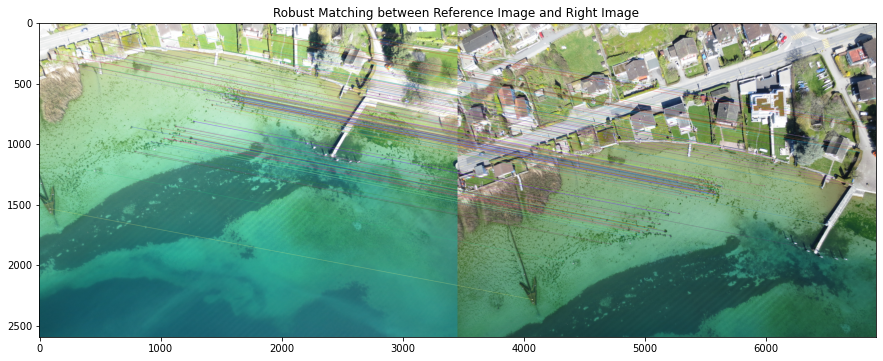

Number of matches 89
Number of best inliers 67


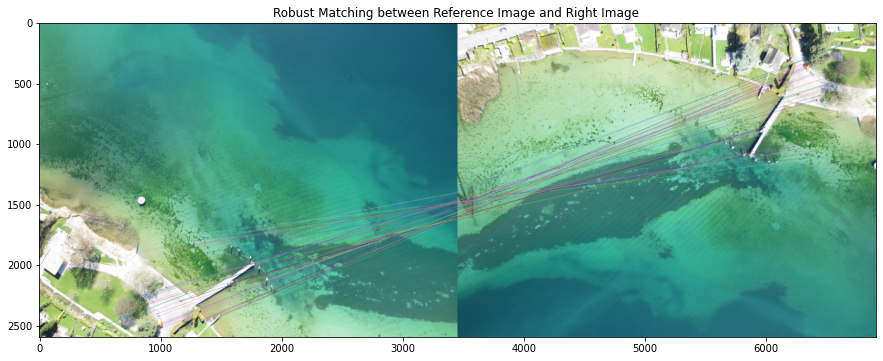

Number of matches 248
Number of best inliers 179


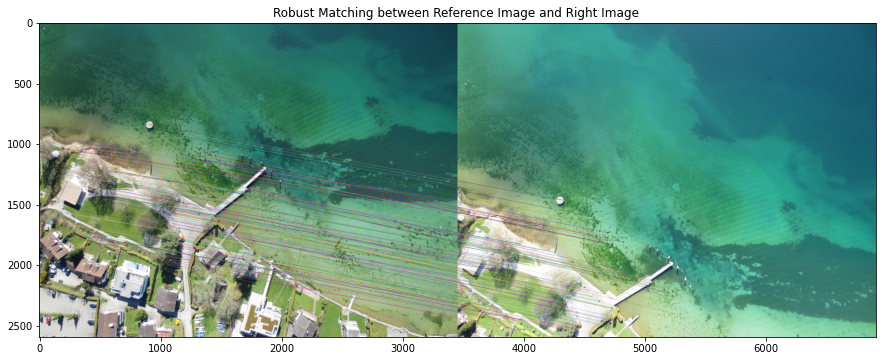

Number of matches 874
Number of best inliers 598


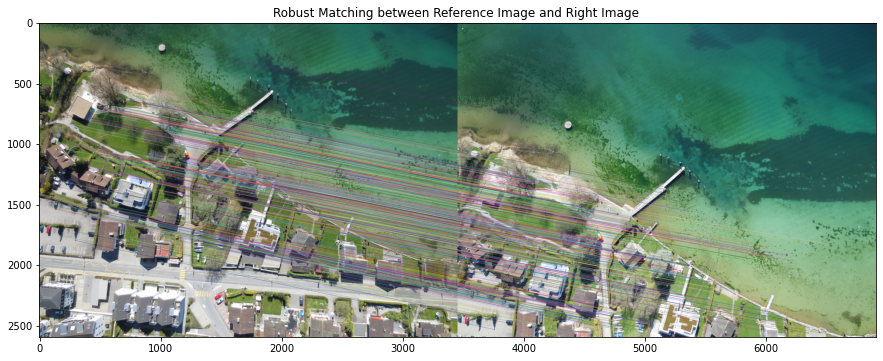

Number of matches 1271
Number of best inliers 830


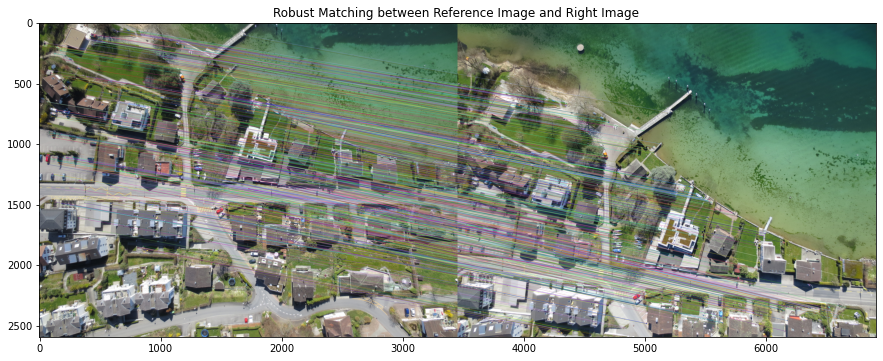

Number of matches 1475
Number of best inliers 678


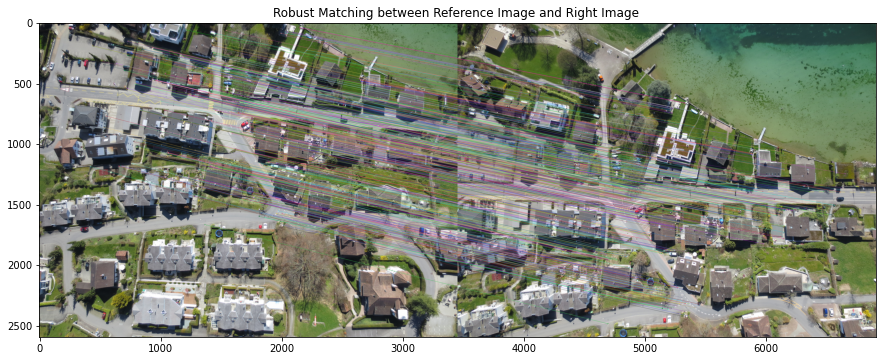

Number of matches 1162
Number of best inliers 484


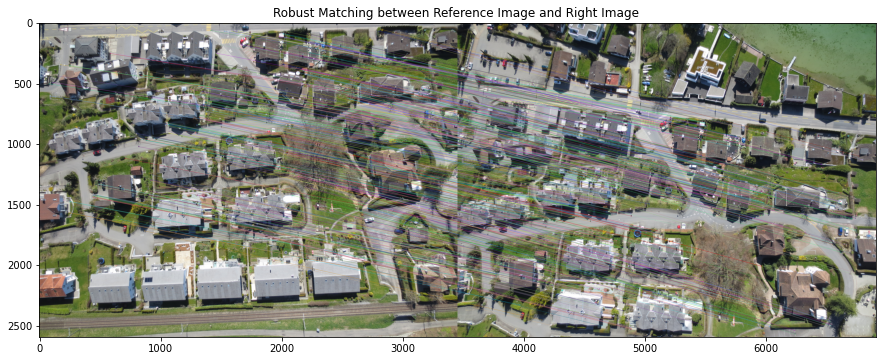

Number of matches 910
Number of best inliers 419


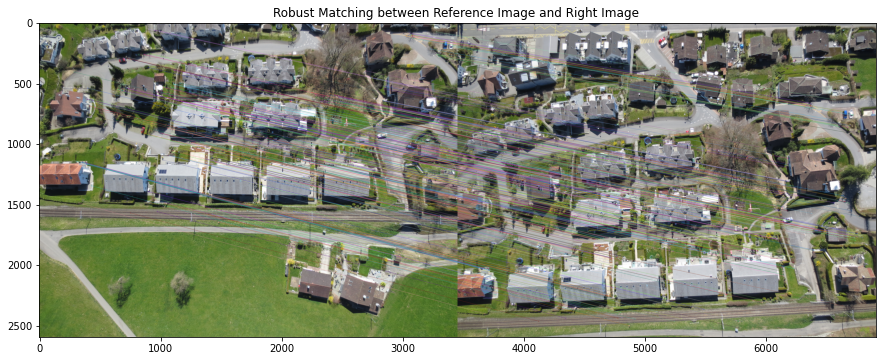

Number of matches 1063
Number of best inliers 554


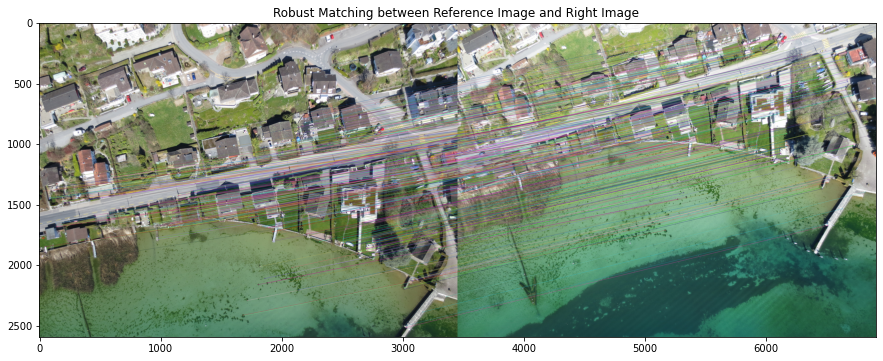

Number of matches 1620
Number of best inliers 671


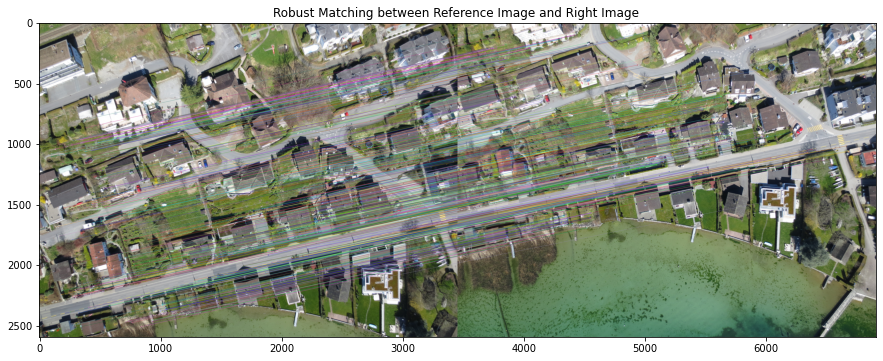

Number of matches 1236
Number of best inliers 557


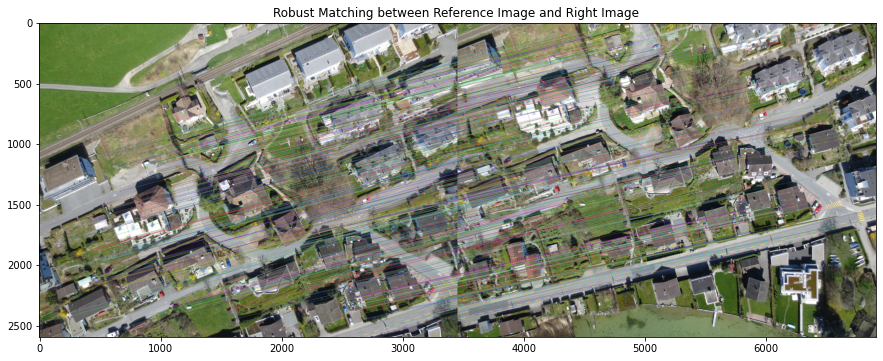

Number of matches 917
Number of best inliers 488


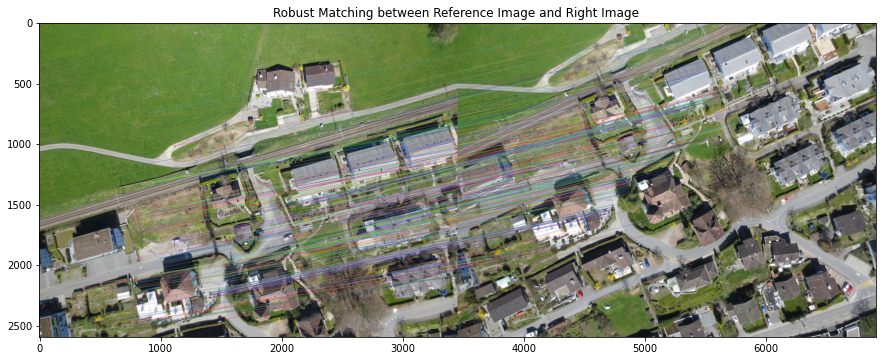

Number of matches 635
Number of best inliers 407


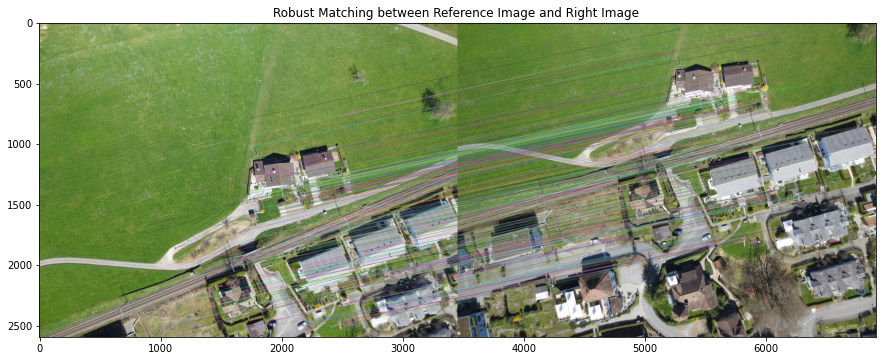

Number of matches 290
Number of best inliers 207


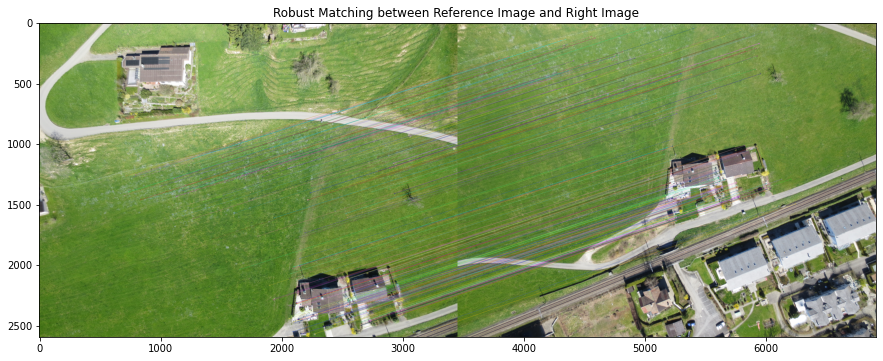

Number of matches 207
Number of best inliers 139


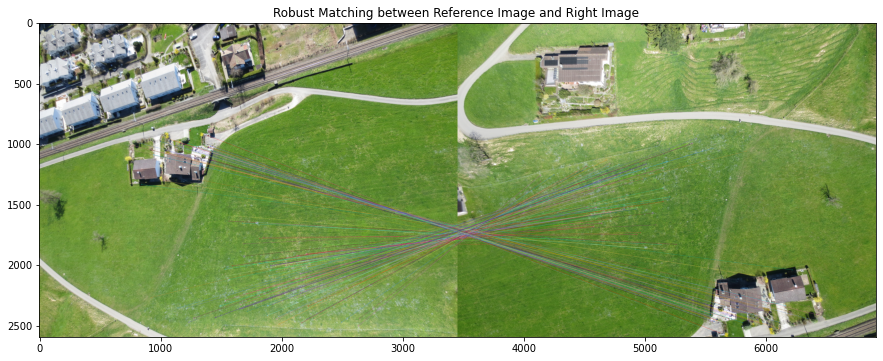

Number of matches 469
Number of best inliers 233


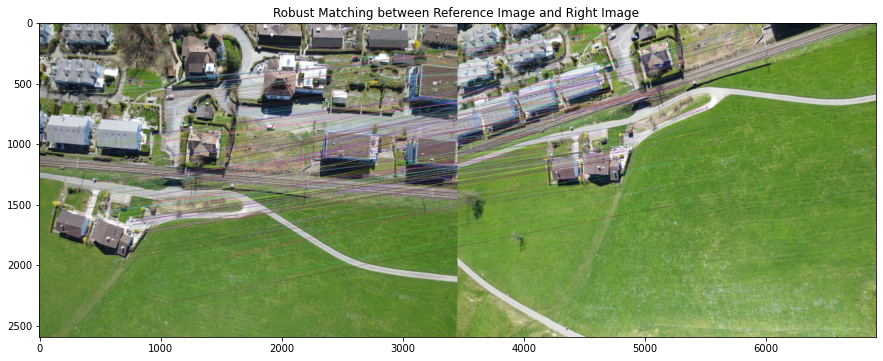

In [97]:
H_left = []
H_right = []

for j in tqdm(range(len(images_left))):
  if j==len(images_left)-1:
    break

  H_a = get_Hmatrix(images_left[j:j+2][::-1],keypoints_all_left[j:j+2][::-1],points_all_left[j:j+2][::-1],descriptors_all_left[j:j+2][::-1])
  H_left.append(H_a)

for j in tqdm(range(len(images_right))):
  if j==len(images_right)-1:
    break

  H_a = get_Hmatrix(images_right[j:j+2][::-1],keypoints_all_right[j:j+2][::-1],points_all_right[j:j+2][::-1],descriptors_all_right[j:j+2][::-1])
  H_right.append(H_a)


In [119]:
print(len(H_left),len(H_right))

8 8


In [92]:
def warpnImages(images_left, images_right,H_left,H_right):
    #img1-centre,img2-left,img3-right

    h, w = images_left[0].shape[:2]

    pts_left = []
    pts_right = []

    pts_centre = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)

    for j in range(len(H_left)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_left.append(pts)

    for j in range(len(H_right)):
      pts = np.float32([[0, 0], [0, h], [w, h], [w, 0]]).reshape(-1, 1, 2)
      pts_right.append(pts)

    pts_left_transformed=[]
    pts_right_transformed=[]

    for j,pts in enumerate(pts_left):
      if j==0:
        H_trans = H_left[j]
      else:
        H_trans = H_trans@H_left[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_left_transformed.append(pts_)

    for j,pts in enumerate(pts_right):
      if j==0:
        H_trans = H_right[j]
      else:
        H_trans = H_trans@H_right[j]
      pts_ = cv2.perspectiveTransform(pts, H_trans)
      pts_right_transformed.append(pts_)


    print('Step1:Done')


    #pts = np.concatenate((pts1, pts2_), axis=0)

    pts_concat = np.concatenate((pts_centre,np.concatenate(np.array(pts_left_transformed),axis=0),np.concatenate(np.array(pts_right_transformed),axis=0)), axis=0)

    [xmin, ymin] = np.int32(pts_concat.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_concat.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    print('Step2:Done')

    warp_imgs_left = []
    warp_imgs_right = []


    for j,H in enumerate(H_left):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_left[j+1], H_trans, (xmax-xmin, ymax-ymin))

      if j==0:
        result[t[1]:h+t[1], t[0]:w+t[0]] = images_left[0]
      
      warp_imgs_left.append(result)


    for j,H in enumerate(H_right):
      if j==0:
        H_trans = Ht@H
      else:
        H_trans = H_trans@H
      result = cv2.warpPerspective(images_right[j+1], H_trans, (xmax-xmin, ymax-ymin))
      
      warp_imgs_right.append(result)

    print('Step3:Done')

    #Union

    warp_images_all = warp_imgs_left + warp_imgs_right

    warp_img_init = warp_images_all[0]

    warp_final_all=[]


    for j,warp_img in enumerate(warp_images_all):
      if j==len(warp_images_all)-1:
        break
      warp_final = np.maximum(warp_img_init,warp_images_all[j+1])
      warp_img_init = warp_final
      warp_final_all.append(warp_final)

    print('Step4:Done')


    return warp_final,warp_final_all








  

In [98]:
combined_warp_n,warp_all = warpnImages(images_left, images_right,H_left,H_right)

Step1:Done
Step2:Done
Step3:Done
Step4:Done


In [10]:




#Display the keypoints
#im_with_keypoints = cv2.drawKeypoints(right, rpkey, np.array([]), (0,0,255))   
#displayplot(im_with_keypoints,'Right Image with keypoints')




In [11]:

#Display the keypoints
#im_with_keypoints = cv2.drawKeypoints(centre, cpkey, np.array([]), (0,0,255))   
#displayplot(im_with_keypoints,'Reference Image with keypoints')




## **Final Mosaiced Image (with 17 images)**

Text(0.5, 1.0, '6-Images Mosaic')

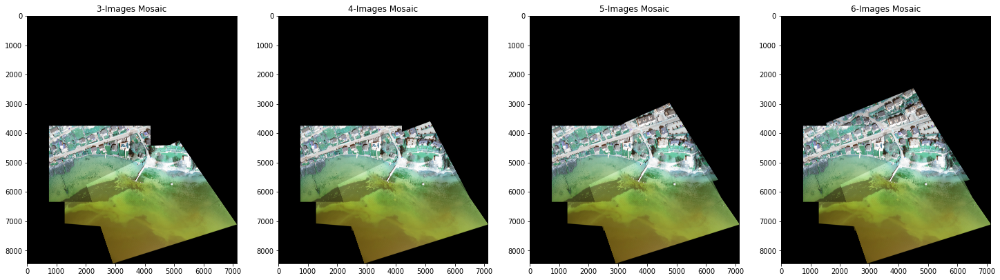

In [107]:
plt.figure(figsize = (25,20))
plt.subplot(141)
plt.imshow(warp_all[0])
plt.title("3-Images Mosaic")
plt.subplot(142)
plt.imshow(warp_all[1])
plt.title("4-Images Mosaic")
plt.subplot(143)
plt.imshow(warp_all[2])
plt.title("5-Images Mosaic")
plt.subplot(144)
plt.imshow(warp_all[3])
plt.title("6-Images Mosaic")

Text(0.5, 1.0, '10-Images Mosaic')

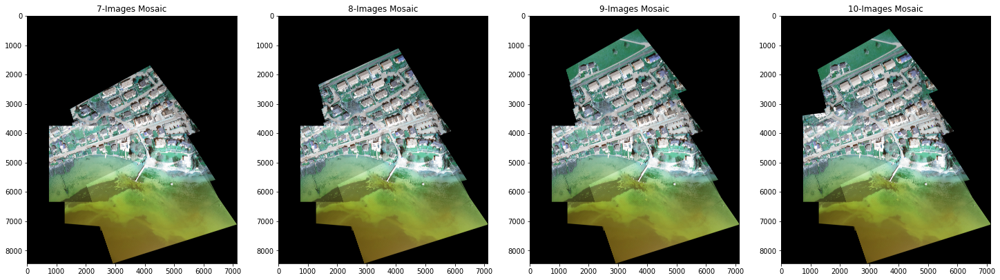

In [112]:
plt.figure(figsize = (25,20))
plt.subplot(141)
plt.imshow(warp_all[4])
plt.title("7-Images Mosaic")
plt.subplot(142)
plt.imshow(warp_all[5])
plt.title("8-Images Mosaic")
plt.subplot(143)
plt.imshow(warp_all[6])
plt.title("9-Images Mosaic")
plt.subplot(144)
plt.imshow(warp_all[7])
plt.title("10-Images Mosaic")

Text(0.5, 1.0, '14-Images Mosaic')

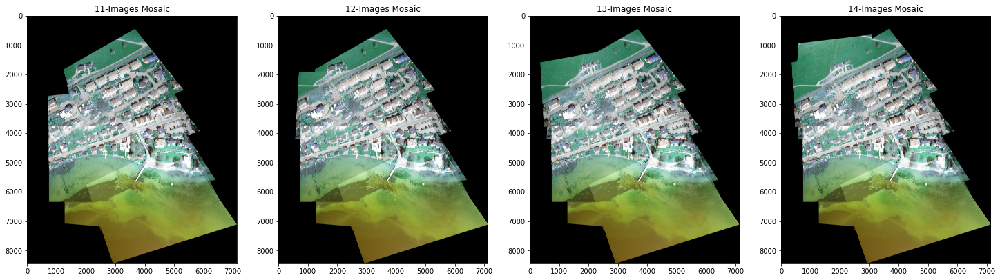

In [109]:
plt.figure(figsize = (25,20))
plt.subplot(141)
plt.imshow(warp_all[8])
plt.title("11-Images Mosaic")
plt.subplot(142)
plt.imshow(warp_all[9])
plt.title("12-Images Mosaic")
plt.subplot(143)
plt.imshow(warp_all[10])
plt.title("13-Images Mosaic")
plt.subplot(144)
plt.imshow(warp_all[11])
plt.title("14-Images Mosaic")

Text(0.5, 1.0, '17-Images Mosaic')

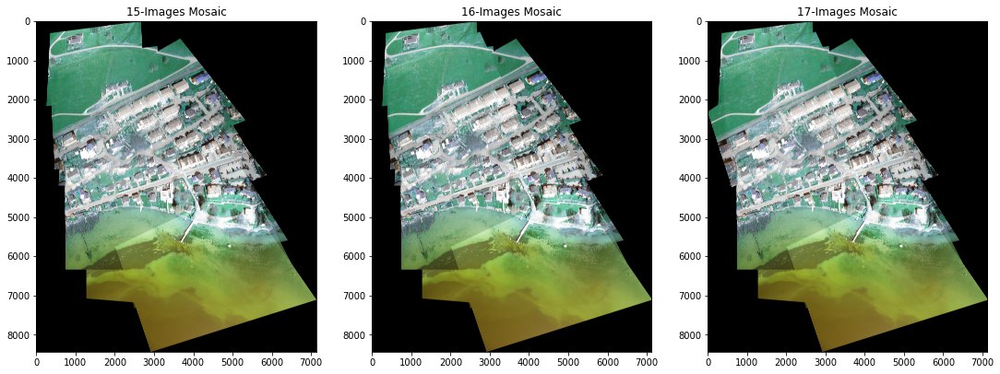

In [111]:
plt.figure(figsize = (25,20))
plt.subplot(141)
plt.imshow(warp_all[12])
plt.title("15-Images Mosaic")
plt.subplot(142)
plt.imshow(warp_all[13])
plt.title("16-Images Mosaic")
plt.subplot(143)
plt.imshow(warp_all[14])
plt.title("17-Images Mosaic")

Text(0.5, 1.0, '17-Images Mosaic')

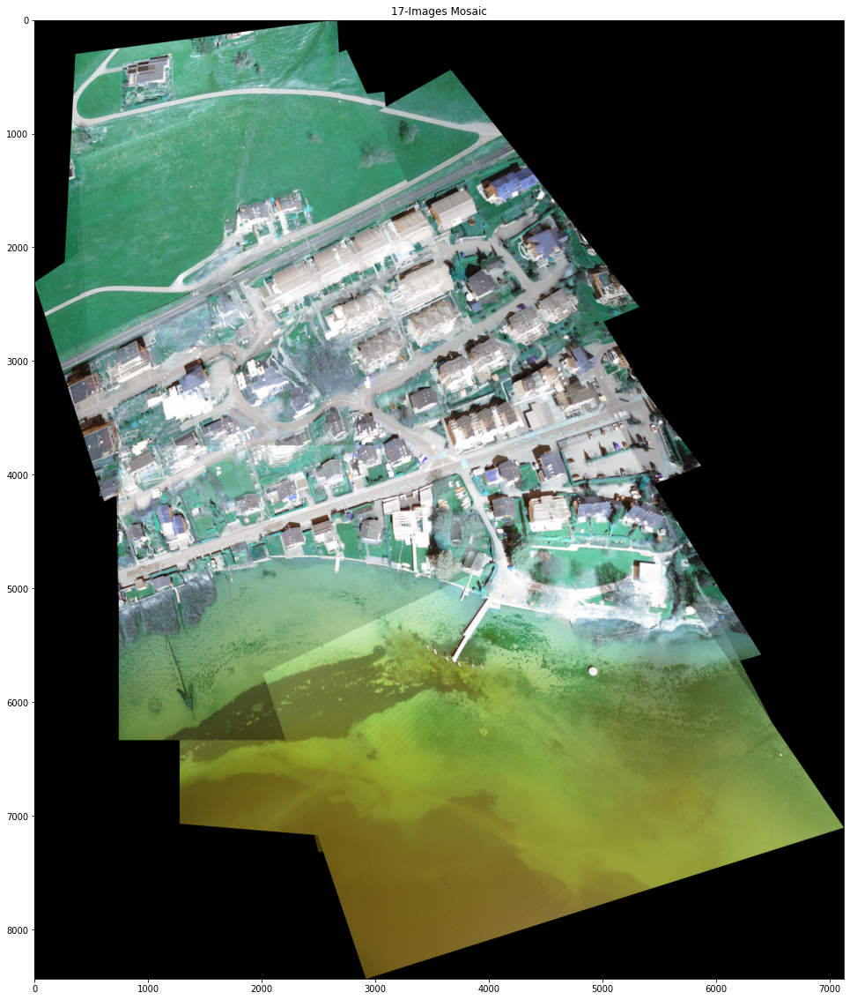

In [114]:
plt.figure(figsize = (25,20))
plt.imshow(combined_warp_n)
plt.title("17-Images Mosaic")

In [116]:
combo_rgb = cv2.cvtColor(combined_warp_n, cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, '17-Images Mosaic')

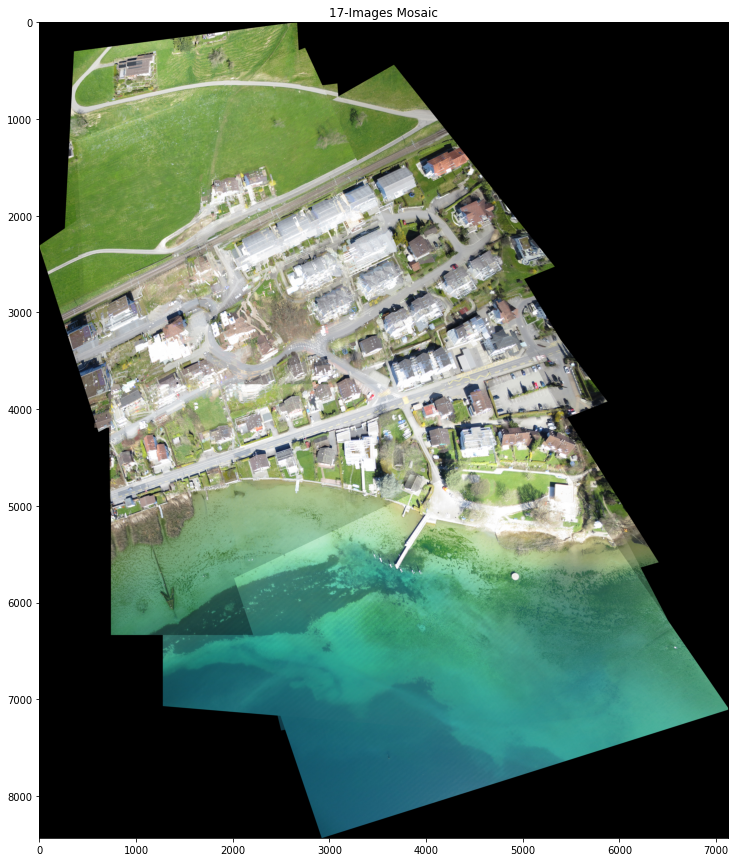

In [118]:
plt.figure(figsize = (25,15))


plt.imshow(combo_rgb)
plt.title('17-Images Mosaic')

## **Observation**

There still seems to be the case, after many trials with different local features, that few images give poor correspondences with their successive images, which leads to the blurry/poorly matched regions as seen above. This could be solved by maybe setting a threshold of minimum number of correspondences required per-match-pair, and if not met, go to the next-image and find the best-possible match then, but that would a tedious process, and untill I can figure out other alternatives for local keypoints/descriptors-maybe a deep-learning keypoints tracker, there wouldn't be a need to skip images.
The algorithm can of-course stitch as many images, however, with the above error happening, it will accumulate when giving a 50/60 image mosaic.


## **To Do Tasks:**


*  Further try out other good keypoints-detectors


*   Reduce time.


